In [1]:
# !pip install plotnine
# !pip install yellowbrick
# !pip install kneed 

Defaulting to user installation because normal site-packages is not writeable


DEPRECATION: textract 1.6.5 has a non-standard dependency specifier extract-msg<=0.29.*. pip 23.3 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of textract or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [2]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
from plotnine import *
import seaborn as sns
import matplotlib.pyplot as plt
from yellowbrick.cluster import KElbowVisualizer
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from scipy.cluster import hierarchy
from scipy.spatial import distance
from sklearn.compose import ColumnTransformer
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from kneed import KneeLocator
import plotly.express as px

plt.figure(figsize=(15,8))
sns.set(rc = {'figure.figsize':(15,8)})

<Figure size 1500x800 with 0 Axes>

In [3]:
def plot_DBSCAN(df, eps, min_samples, plot=False):
    labels = DBSCAN(eps=eps, min_samples=min_samples).fit(df).labels_
    hue = [str(i) for i in labels]
    print(silhouette_score(df, labels))
    if plot:
        sns.scatterplot(x=df[:, 0], y=df[:, 1], hue=hue)
        plt.show()
    return labels

def plot_KMeans(df, n_clusters, plot=False):
    kmeans = KMeans(n_clusters=n_clusters).fit(df)
    hue = [str(i) for i in kmeans.labels_]
    print(silhouette_score(df, kmeans.labels_))
    if plot:
        sns.scatterplot(x=df[:, 0], y=df[:, 1], hue=hue)
        plt.show()
    return kmeans.labels_


def plot_Agg(df, n_clusters=2, plot=False):
    clustering = AgglomerativeClustering(n_clusters=n_clusters).fit(df)
    hue = [str(i) for i in clustering.labels_]
    print(silhouette_score(df, clustering.labels_))
    if plot:
        sns.scatterplot(x=df[:, 0], y=df[:, 1], hue=hue)
        plt.show()
    return clustering.labels_

def plot_gaussian(df_scaled, k):
    gm = GaussianMixture(k)
    gm.fit(df_scaled)
    labels = gm.predict(df_scaled)
    print(silhouette_score(df_scaled, labels))
    return labels

def elbow(df,model, k=7):
    model = KElbowVisualizer(model, k=k)
    model.fit(df)
    model.show()


def plot_1d(pca_df, labels):
    sns.scatterplot(pca_df[:, 0], np.zeros_like(pca_df[:, 0]), hue=labels)
    plt.show()

In [4]:
train_df = pd.read_csv("Data.csv")
test_df = pd.read_csv("Test.csv")

In [5]:
train_df.head()

,ID,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
0,462809.0,Male,No,22.0,No,Healthcare,1.0,Low,4.0,Cat_4,D
1,462643.0,Female,Yes,38.0,Yes,Engineer,NaN,Average,3.0,Cat_4,A
2,466315.0,Female,Yes,67.0,Yes,Engineer,1.0,Low,1.0,Cat_6,B
3,461735.0,Male,Yes,67.0,Yes,Lawyer,0.0,High,2.0,Cat_6,B
4,462669.0,Female,Yes,40.0,Yes,Entertainment,NaN,High,6.0,Cat_6,A


In [6]:
test_df.head()

,ID,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
0,458989,Female,Yes,36,Yes,Engineer,0.0,Low,1.0,Cat_6,B
1,458994,Male,Yes,37,Yes,Healthcare,8.0,Average,4.0,Cat_6,A
2,458996,Female,Yes,69,No,NaN,0.0,Low,1.0,Cat_6,A
3,459000,Male,Yes,59,No,Executive,11.0,High,2.0,Cat_6,B
4,459001,Female,No,19,No,Marketing,NaN,Low,4.0,Cat_6,A


In [7]:
class Data_Analysis:
    def view_dataset(self, df):
        print(df.head())
    def checkk_nan(self, df):
        print(df.isna().sum())
    
    def remove_nan(self, df):
        print("Shape of dataset before removing missing values: ", df.shape)
        df.dropna(inplace=True)
        print("Shape of dataset after removing missing values: ", df.shape)
        return df
        
da = Data_Analysis()

In [8]:
train_df = da.remove_nan(train_df)


Shape of dataset before removing missing values:  (70000, 11)
Shape of dataset after removing missing values:  (57389, 11)


In [9]:
train_df.describe()

,ID,Age,Work_Experience,Family_Size
count,57389.000000,57389.000000,57389.000000,57389.000000
mean,463492.073394,43.198923,2.682622,2.850633
std,2598.090079,16.646184,3.453909,1.520438
min,458982.000000,18.000000,0.000000,1.000000
25%,461243.000000,30.000000,0.000000,2.000000
50%,463479.000000,40.000000,1.000000,3.000000
75%,465753.000000,53.000000,5.000000,4.000000
max,467974.000000,89.000000,14.000000,9.000000


In [10]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 57389 entries, 0 to 69999
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ID               57389 non-null  float64
 1   Gender           57389 non-null  object 
 2   Ever_Married     57389 non-null  object 
 3   Age              57389 non-null  float64
 4   Graduated        57389 non-null  object 
 5   Profession       57389 non-null  object 
 6   Work_Experience  57389 non-null  float64
 7   Spending_Score   57389 non-null  object 
 8   Family_Size      57389 non-null  float64
 9   Var_1            57389 non-null  object 
 10  Segmentation     57389 non-null  object 
dtypes: float64(4), object(7)
memory usage: 5.3+ MB


In [11]:
train_df.columns

Index(['ID', 'Gender', 'Ever_Married', 'Age', 'Graduated', 'Profession',
       'Work_Experience', 'Spending_Score', 'Family_Size', 'Var_1',
       'Segmentation'],
      dtype='object')

<h1>Uni Variate Nalaysis</h1>

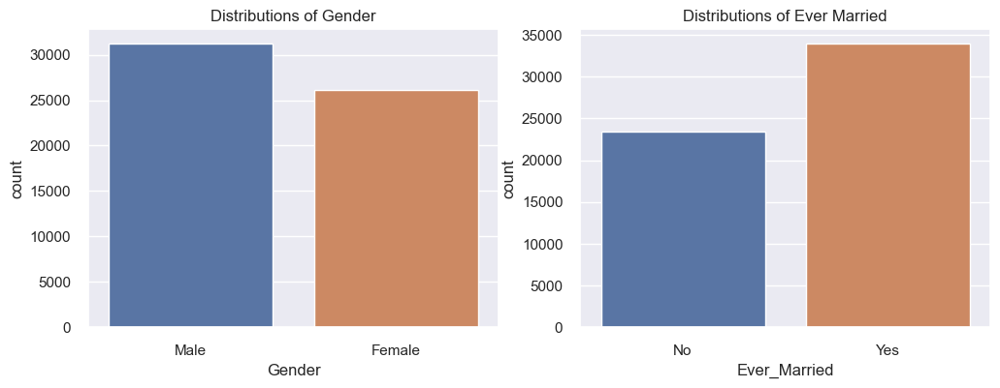

In [12]:
plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
sns.countplot(x=train_df['Gender'])
plt.title("Distributions of Gender")    

plt.subplot(1,2,2)
sns.countplot(x=train_df['Ever_Married'])
plt.title("Distributions of Ever Married")
plt.show()

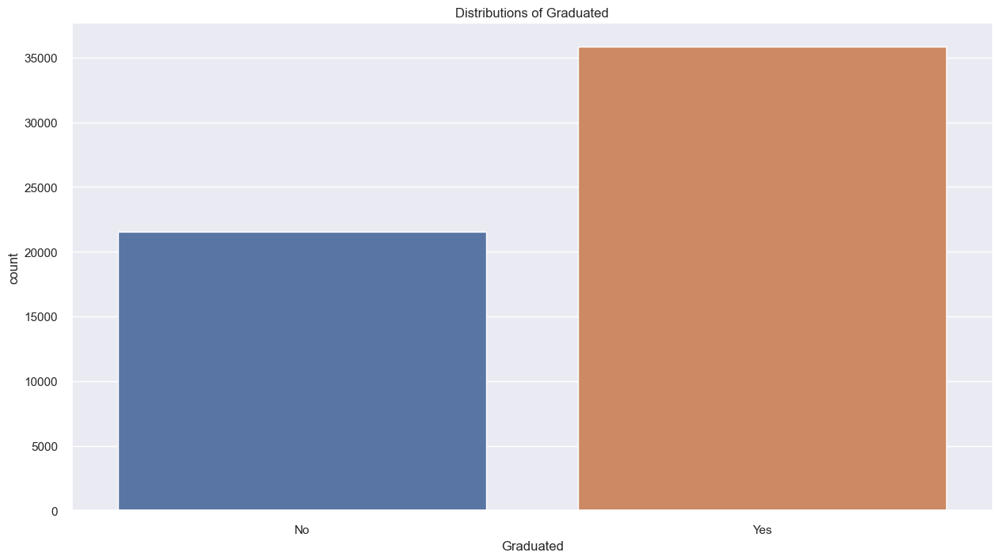

In [13]:
sns.countplot(x=train_df['Graduated'])
plt.title("Distributions of Graduated")
plt.show()

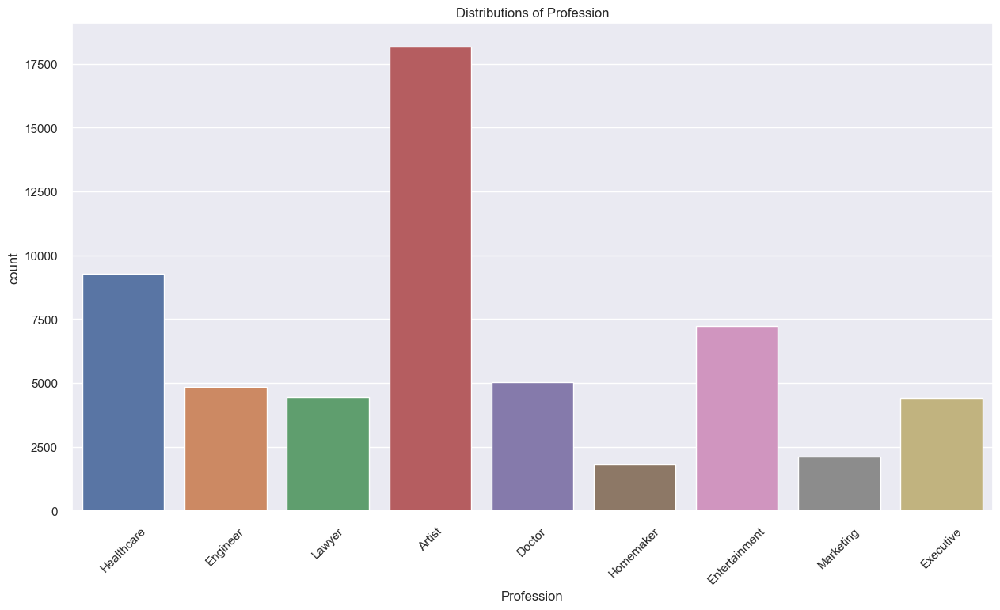

In [14]:
sns.countplot(x=train_df['Profession'])
plt.title("Distributions of Profession")
plt.xticks(rotation=45)
plt.show()

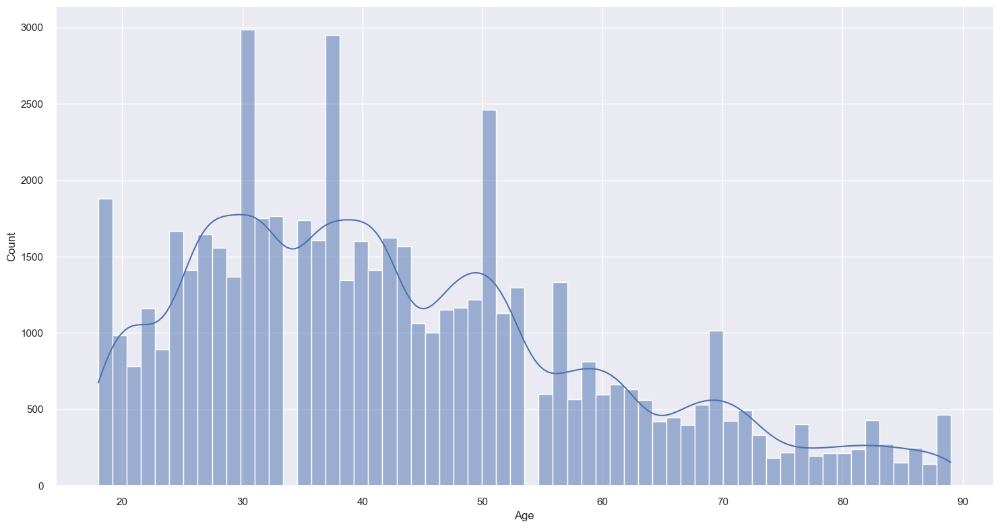

In [15]:
sns.displot(data = train_df, x='Age', kde=True, height=8, aspect=15/8)

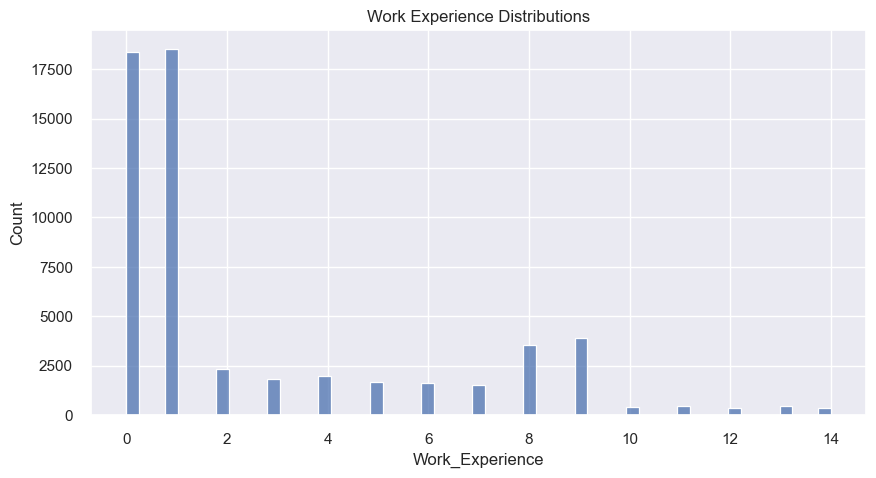

In [16]:
plt.figure(figsize=(10,5))
sns.histplot(train_df['Work_Experience'])
plt.title("Work Experience Distributions")
plt.show()

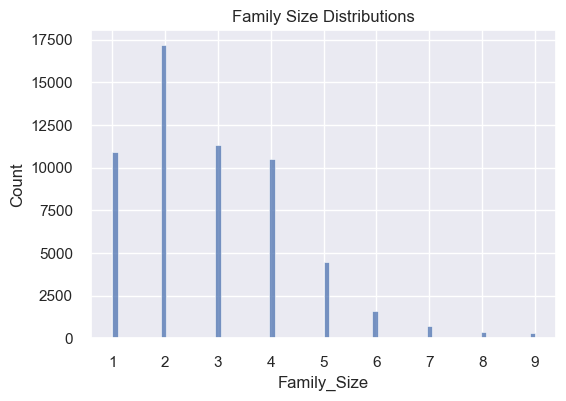

In [17]:
plt.figure(figsize=(6,4))
sns.histplot(train_df['Family_Size'])
plt.title("Family Size Distributions")
plt.show()

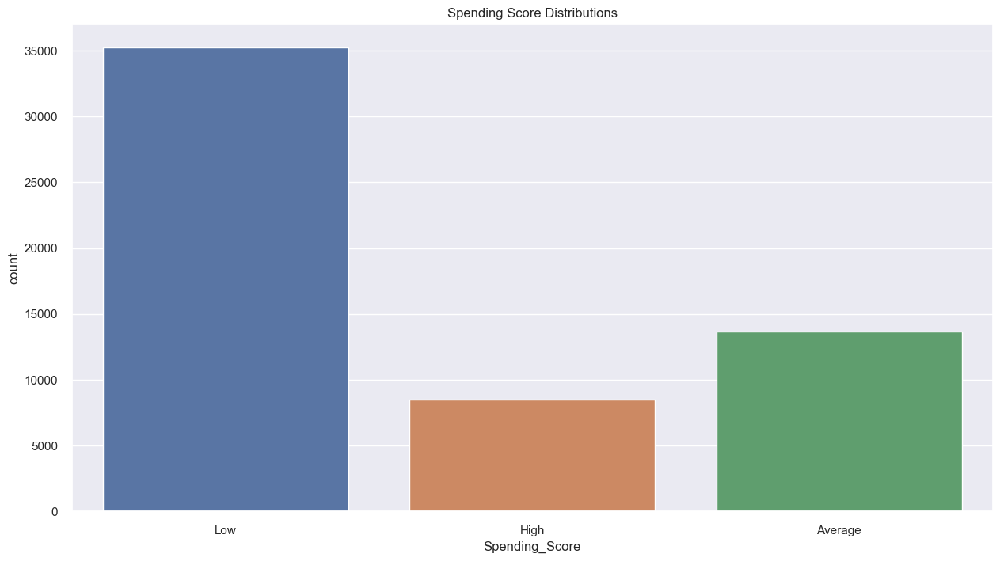

In [18]:
sns.countplot(x=train_df['Spending_Score'])
plt.title("Spending Score Distributions")
plt.show()

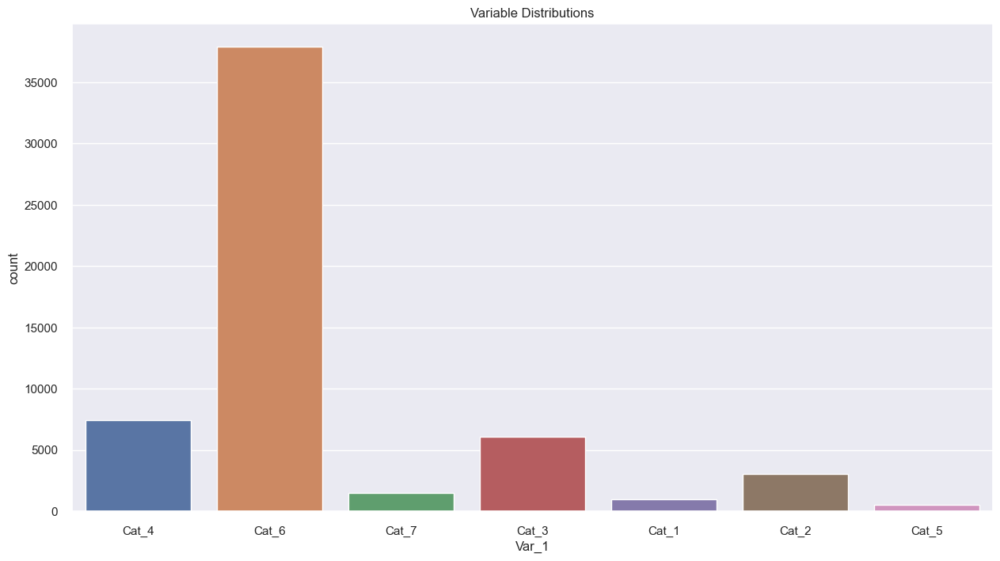

In [19]:
sns.countplot(x=train_df['Var_1'])
plt.title("Variable Distributions")
plt.show()

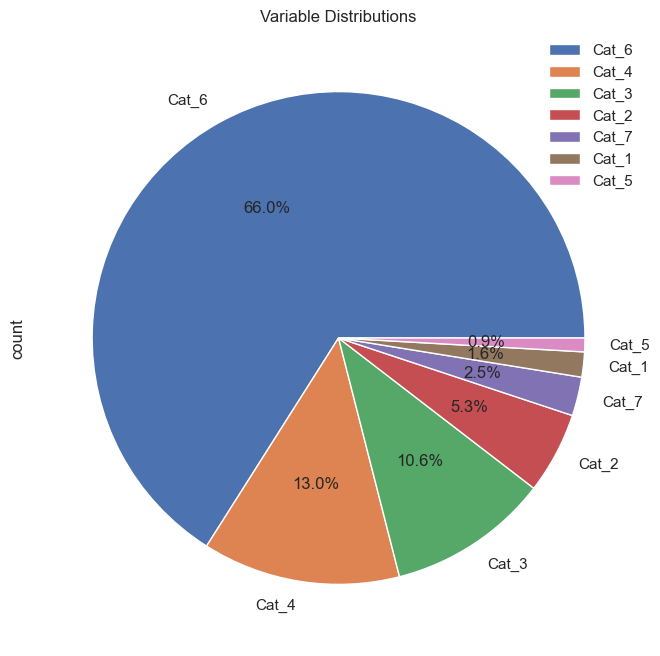

In [20]:
train_df['Var_1'].value_counts().plot(kind="pie",autopct="%.1f%%")
plt.title("Variable Distributions")
plt.legend()
plt.show()

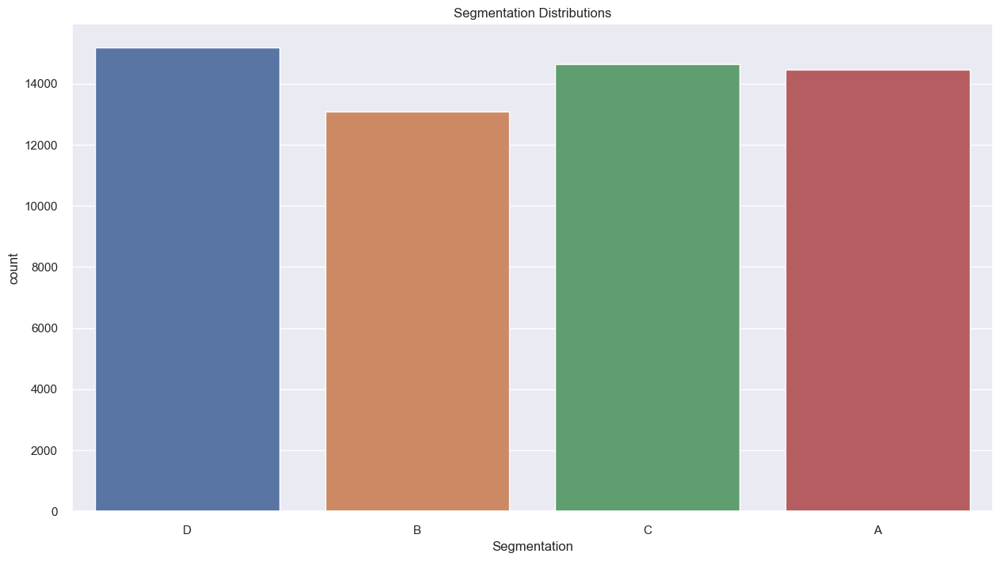

In [21]:
sns.countplot(x=train_df['Segmentation'])
plt.title("Segmentation Distributions")
plt.show()

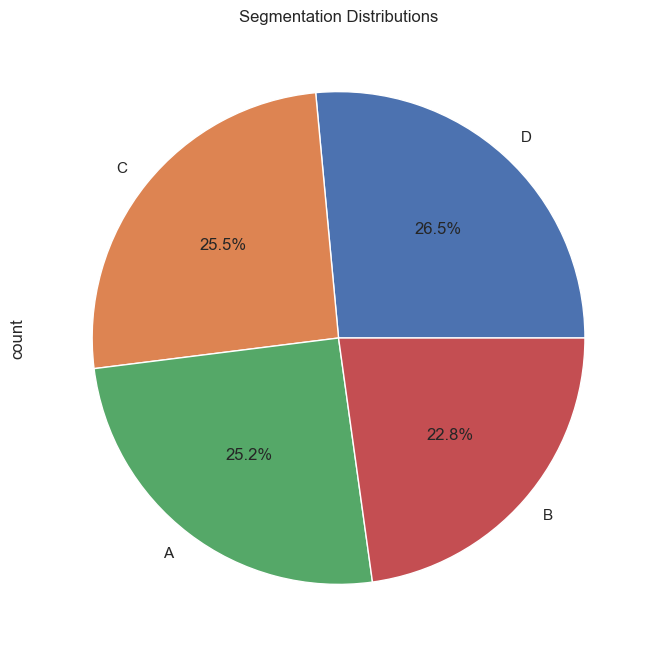

In [22]:
train_df['Segmentation'].value_counts().plot(kind="pie",autopct="%.1f%%")
plt.title("Segmentation Distributions")
plt.show()

<h1>Bi-Variate Analysis</h1>

In [23]:
print(train_df['Age'].min())
print(train_df['Age'].max())
print(train_df['Age'].mean())
print(train_df['Age'].median())
print(train_df['Age'].mode()[0])

18.0
89.0
43.19892313858056
40.0
33.0


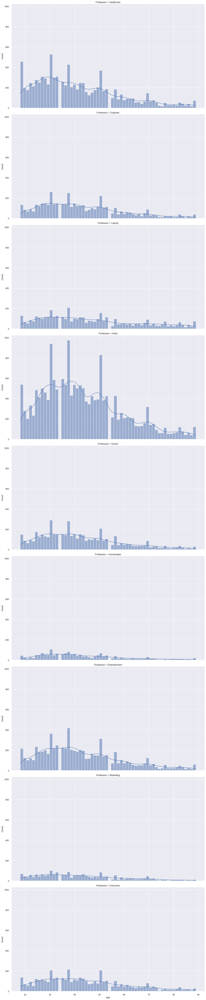

In [24]:
sns.displot(data = train_df, x='Age', row='Profession', kde=True, height=8, aspect=15/8)


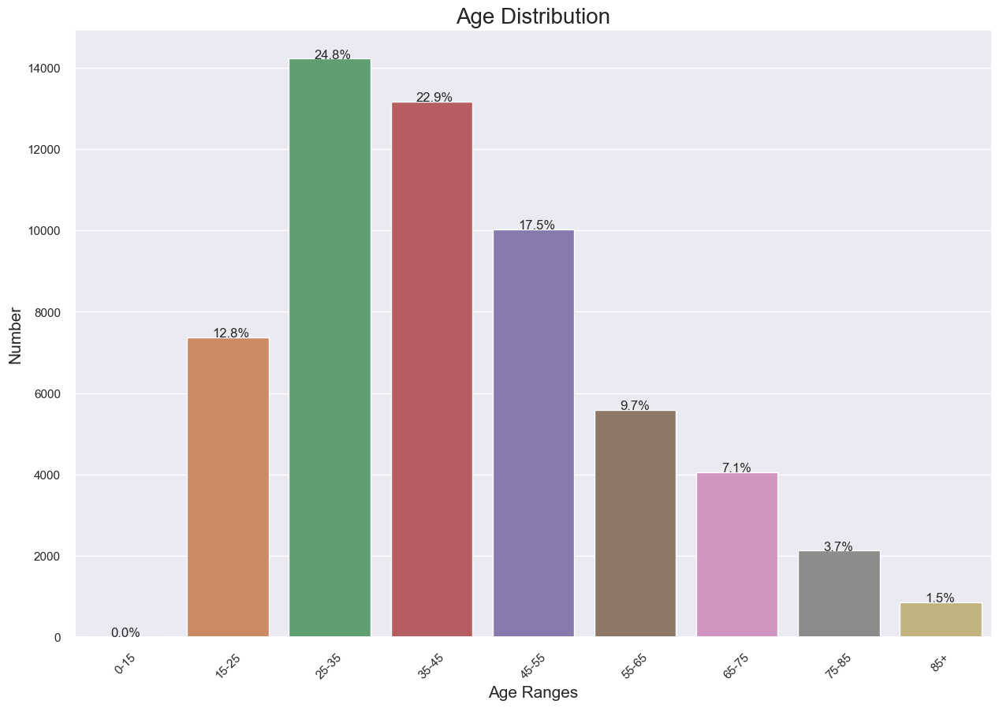

In [25]:
dummy_df = train_df.copy()
dummy_df['Age'] = pd.cut(dummy_df['Age'],
                     bins=[0, 15, 25, 35, 45, 55, 65, 75, 85, np.inf],
                     labels=['0-15', '15-25', '25-35', '35-45', '45-55', '55-65', '65-75', '75-85', '85+'])

# Convert 'Age' column to a categorical data type with the specified order
age_order = ['0-15', '15-25', '25-35', '35-45', '45-55', '55-65', '65-75', '75-85', '85+']
dummy_df['Age'] = pd.Categorical(dummy_df['Age'], categories=age_order, ordered=True)

# Create a countplot
fig, ax = plt.subplots(figsize=(15, 10))
ax.set_title('Age Distribution', fontsize=20)

# Sort the age ranges for better readability
sns.countplot(x='Age', data=dummy_df, order=age_order)

ax.set_ylabel('Number', fontsize=15)
ax.set_xlabel('Age Ranges', fontsize=15)

# Add percentage values on top of the bars
total = len(dummy_df['Age'])
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height() / total)
    x = p.get_x() + p.get_width() / 2 - 0.15
    y = p.get_height() + 10
    ax.annotate(percentage, (x, y), fontsize=12)

plt.xticks(rotation=45)
plt.show()

<Axes: xlabel='Gender', ylabel='count'>

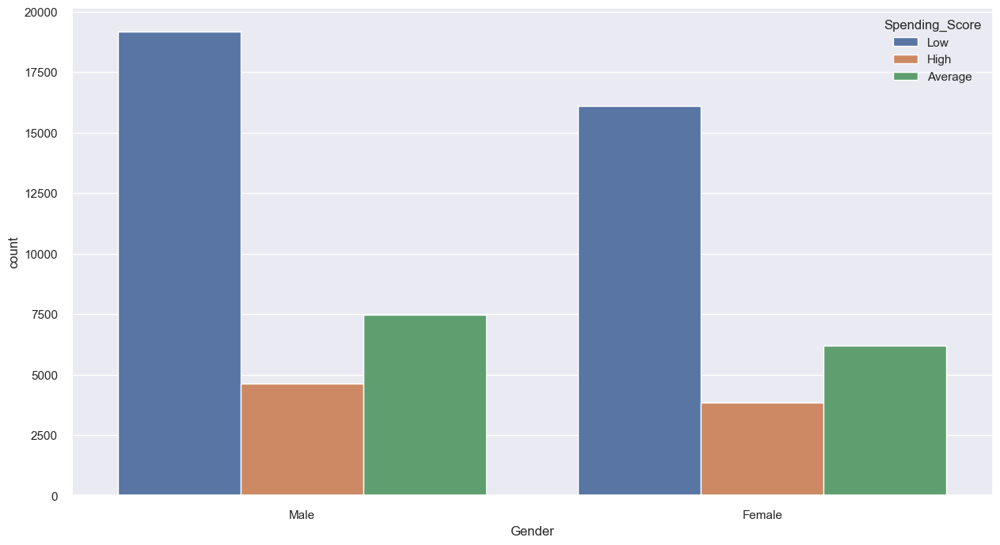

In [26]:
sns.countplot(data=train_df, x='Gender', hue='Spending_Score')

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'Healthcare'),
  Text(1, 0, 'Engineer'),
  Text(2, 0, 'Lawyer'),
  Text(3, 0, 'Artist'),
  Text(4, 0, 'Doctor'),
  Text(5, 0, 'Homemaker'),
  Text(6, 0, 'Entertainment'),
  Text(7, 0, 'Marketing'),
  Text(8, 0, 'Executive')])

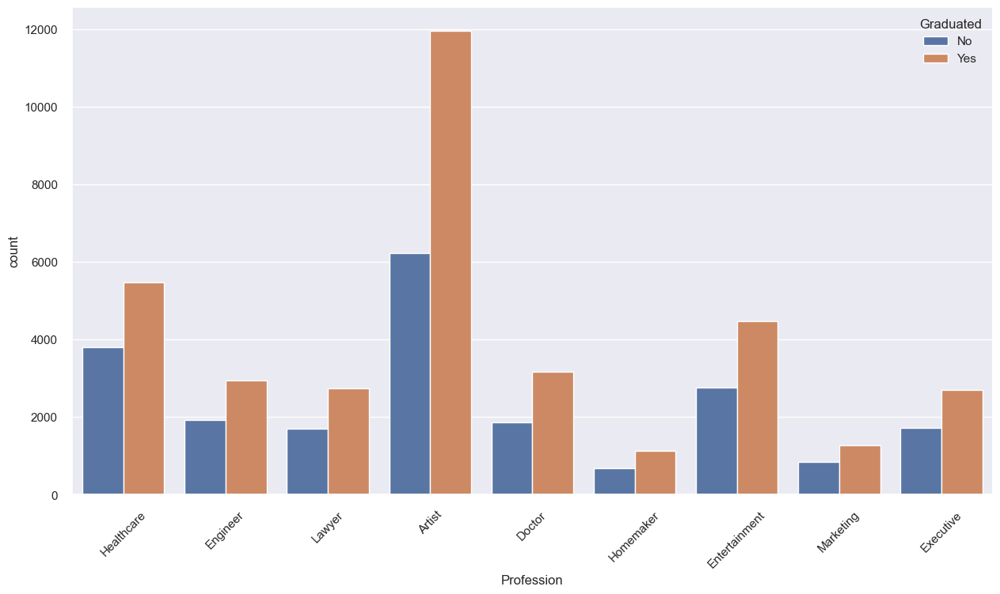

In [27]:
sns.countplot(data = train_df, x='Profession', hue='Graduated')
plt.xticks(rotation=45)


(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'Healthcare'),
  Text(1, 0, 'Engineer'),
  Text(2, 0, 'Lawyer'),
  Text(3, 0, 'Artist'),
  Text(4, 0, 'Doctor'),
  Text(5, 0, 'Homemaker'),
  Text(6, 0, 'Entertainment'),
  Text(7, 0, 'Marketing'),
  Text(8, 0, 'Executive')])

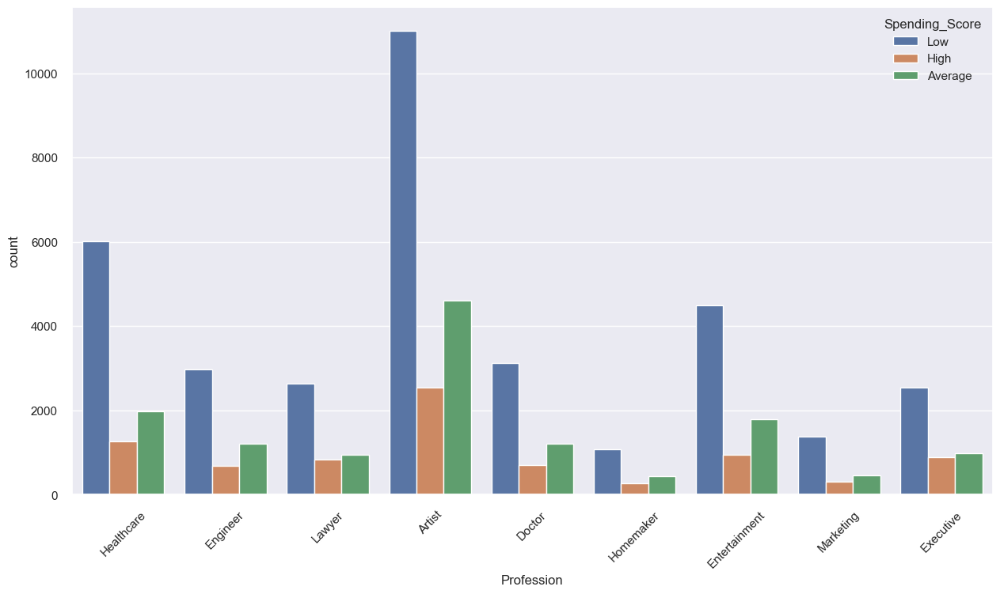

In [28]:
sns.countplot(data = train_df, x='Profession', hue='Spending_Score')
plt.xticks(rotation=45)


(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, '1.0'),
  Text(1, 0, '2.0'),
  Text(2, 0, '3.0'),
  Text(3, 0, '4.0'),
  Text(4, 0, '5.0'),
  Text(5, 0, '6.0'),
  Text(6, 0, '7.0'),
  Text(7, 0, '8.0'),
  Text(8, 0, '9.0')])

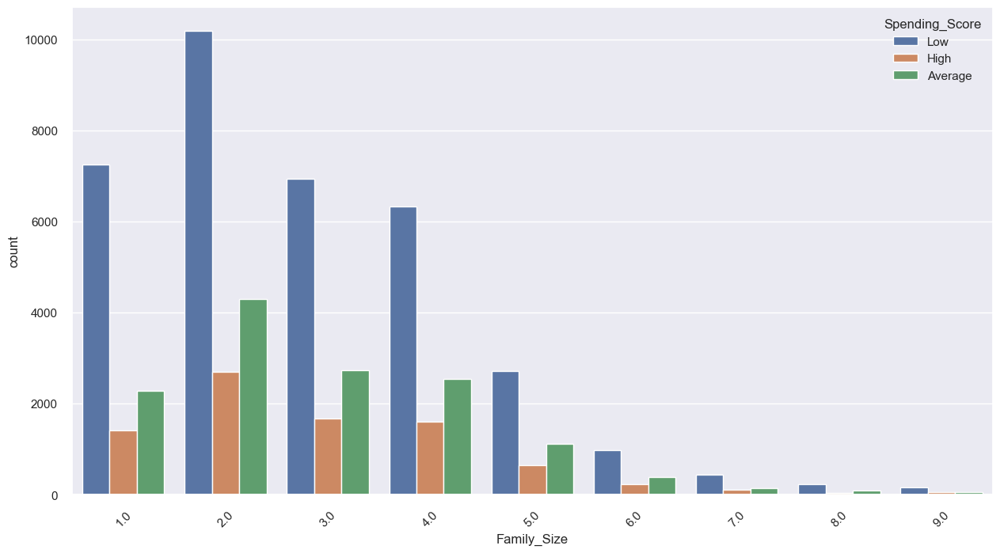

In [29]:
sns.countplot(data = train_df, x='Family_Size', hue='Spending_Score')
plt.xticks(rotation=45)


<h1>Correlation ANalysis</h1>

In [30]:
train_df.reset_index(inplace=True, drop=True)

In [31]:
train_df.head()

,ID,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
0,462809.0,Male,No,22.0,No,Healthcare,1.0,Low,4.0,Cat_4,D
1,466315.0,Female,Yes,67.0,Yes,Engineer,1.0,Low,1.0,Cat_6,B
2,461735.0,Male,Yes,67.0,Yes,Lawyer,0.0,High,2.0,Cat_6,B
3,461319.0,Male,Yes,56.0,No,Artist,0.0,Average,2.0,Cat_6,C
4,460156.0,Male,No,32.0,Yes,Healthcare,1.0,Low,3.0,Cat_6,C


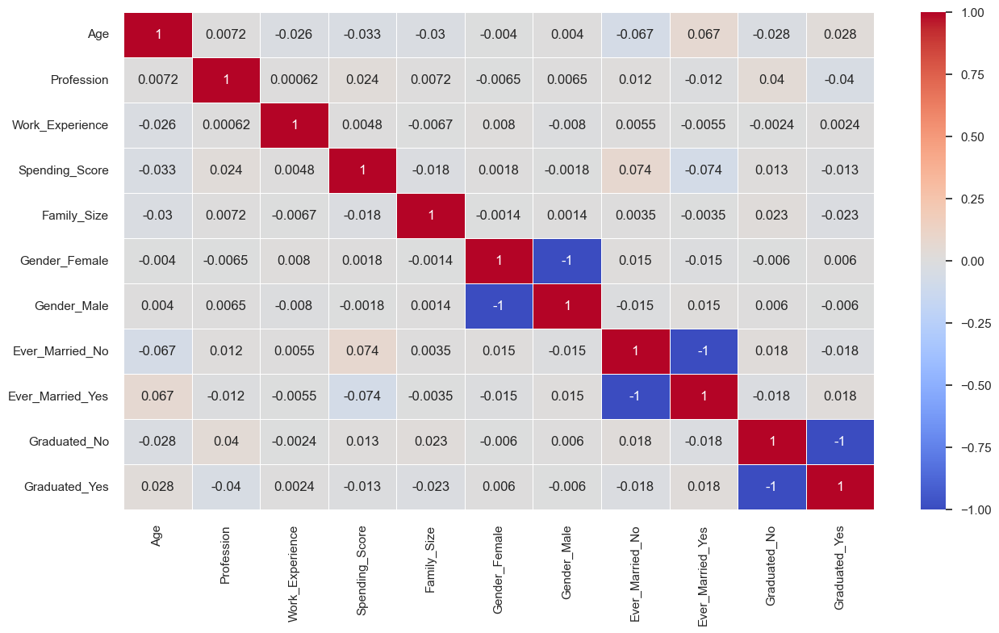

In [32]:
make_cat = ['Profession', 'Spending_Score']
make_dummies = ['Gender', 'Ever_Married', 'Graduated'] 

train_df = pd.get_dummies(train_df, columns=make_dummies)

for col in make_cat:
    train_df[col] =train_df[col].astype('category')

train_df[make_cat] = OrdinalEncoder().fit_transform(train_df[make_cat])
columns_to_drop = ["ID","Var_1","Segmentation"]
train_df.drop(columns_to_drop, axis=1, inplace=True)
train_df = train_df.astype({'Gender_Female': int, 'Gender_Male': int, "Ever_Married_No": int, "Ever_Married_Yes": int, "Graduated_No": int,"Graduated_Yes": int})
correlation_matrix = train_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', cbar=True, linewidths=.5)
plt.show()

<h1>Outlier ANalysis</h1>

In [33]:
def create_outlier_charT(column_name):
    Q1 = train_df[column_name].quantile(0.25)
    Q3 = train_df[column_name].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = train_df[(train_df[column_name] < lower_bound) | (train_df[column_name] > upper_bound)]
    plt.figure(figsize=(8, 6))
    plt.scatter(train_df.index, train_df[column_name], label='Data')
    plt.scatter(outliers.index, outliers[column_name], color='r', label='Outliers')
    plt.axhline(y=lower_bound, color='g', linestyle='--', label='Lower Bound')
    plt.axhline(y=upper_bound, color='g', linestyle='--', label='Upper Bound')
    plt.xlabel('Index')
    plt.ylabel(column_name)
    plt.legend()
    plt.title('Identifying and Plotting Outliers')
    plt.show()

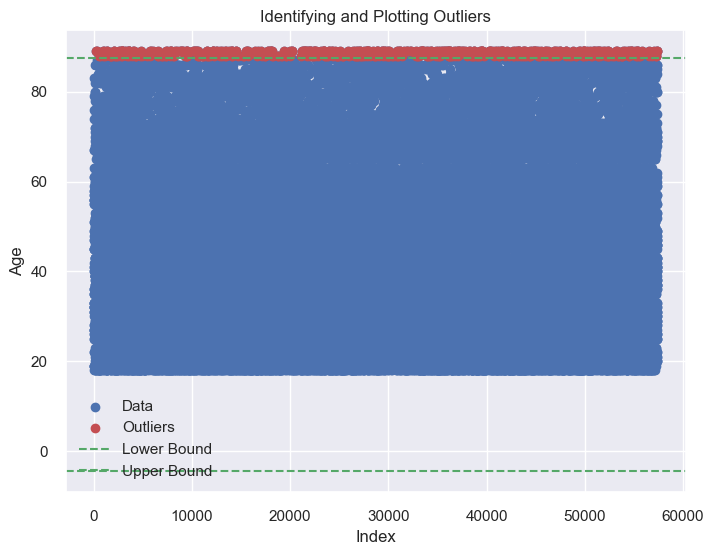

In [34]:
create_outlier_charT("Age")

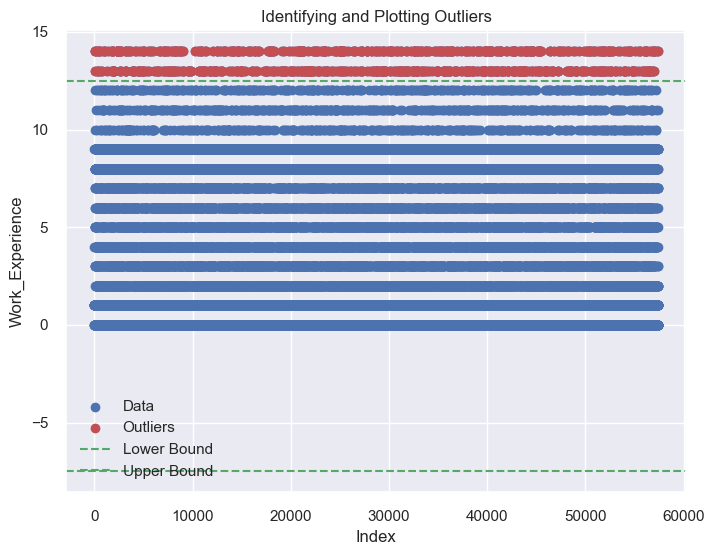

In [35]:
create_outlier_charT("Work_Experience")

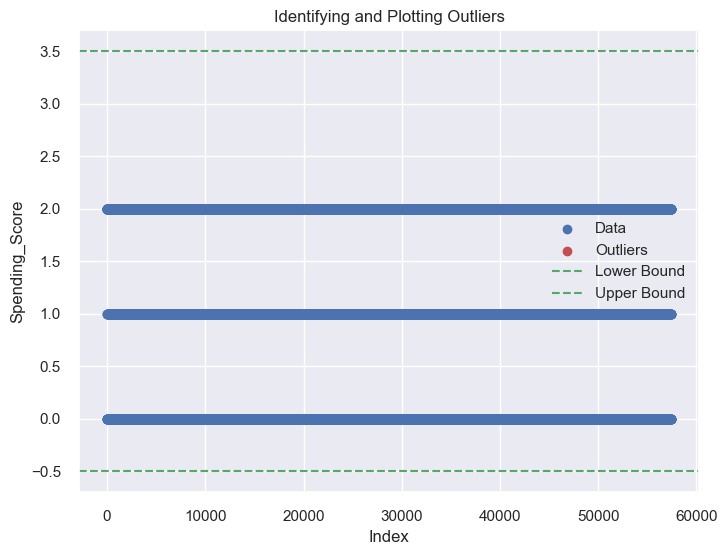

In [36]:
create_outlier_charT("Spending_Score")

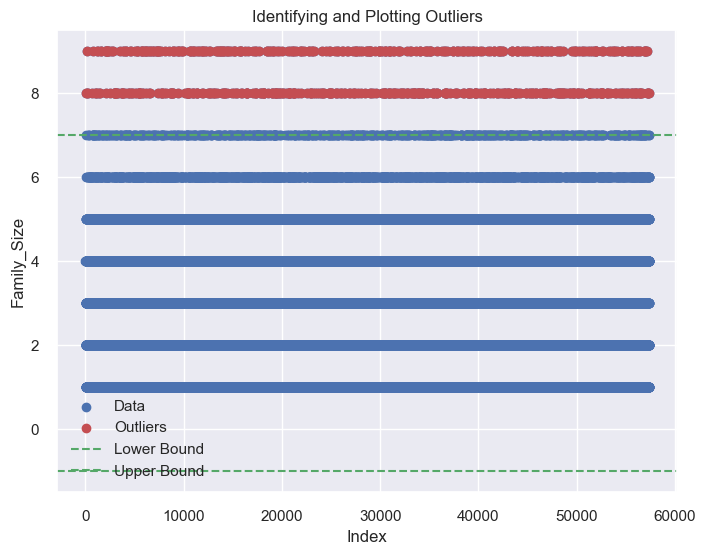

In [37]:
create_outlier_charT("Family_Size")

In [38]:
df = pd.read_csv("Data.csv")
df.dropna(inplace=True)
make_dummies = ['Gender', 'Ever_Married', 'Graduated'] 
make_cat = ['Profession', 'Spending_Score']
df = pd.get_dummies(df, columns=make_dummies)

for col in make_cat:
    df[col] = df[col].astype('category')

df[make_cat] = OrdinalEncoder().fit_transform(df[make_cat])
columns_to_drop = ["ID","Var_1","Segmentation"]
df.drop(columns_to_drop, axis=1, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 57389 entries, 0 to 69999
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Age               57389 non-null  float64
 1   Profession        57389 non-null  float64
 2   Work_Experience   57389 non-null  float64
 3   Spending_Score    57389 non-null  float64
 4   Family_Size       57389 non-null  float64
 5   Gender_Female     57389 non-null  bool   
 6   Gender_Male       57389 non-null  bool   
 7   Ever_Married_No   57389 non-null  bool   
 8   Ever_Married_Yes  57389 non-null  bool   
 9   Graduated_No      57389 non-null  bool   
 10  Graduated_Yes     57389 non-null  bool   
dtypes: bool(6), float64(5)
memory usage: 3.0 MB


In [39]:
def remove_outliers(column_name, df):
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df = df[~((df[column_name] < lower_bound) | (df[column_name] > upper_bound))]
    return df

In [40]:
df = remove_outliers("Age", df)
df = remove_outliers("Work_Experience", df)
df = remove_outliers("Family_Size", df)


In [41]:
df.head()

,Age,Profession,Work_Experience,Spending_Score,Family_Size,Gender_Female,Gender_Male,Ever_Married_No,Ever_Married_Yes,Graduated_No,Graduated_Yes
0,22.0,5.0,1.0,2.0,4.0,False,True,True,False,True,False
2,67.0,2.0,1.0,2.0,1.0,True,False,False,True,False,True
3,67.0,7.0,0.0,1.0,2.0,False,True,False,True,False,True
5,56.0,0.0,0.0,0.0,2.0,False,True,False,True,True,False
6,32.0,5.0,1.0,2.0,3.0,False,True,True,False,False,True


<h2>K Means Clustering Elbow</h2>

In [42]:
columns_to_scale = ['Age', 'Profession', 'Work_Experience', 'Spending_Score', 'Family_Size']
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), columns_to_scale),
        ('passthrough', 'passthrough', df.columns.difference(columns_to_scale).tolist())
    ])
scaled_data = preprocessor.fit_transform(df)
# df = pd.DataFrame(scaled_data, columns=df.columns)


<h3>Implement PCA</h3>

In [43]:
pca = PCA(n_components=2)
principal_components = pca.fit_transform(scaled_data)
pc_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])


In [44]:
pc_df.head()

,PC1,PC2
0,-1.691999,0.404031
1,1.080528,-1.765697
2,1.190093,-1.229002
3,2.162635,0.371006
4,-1.091930,-0.345986


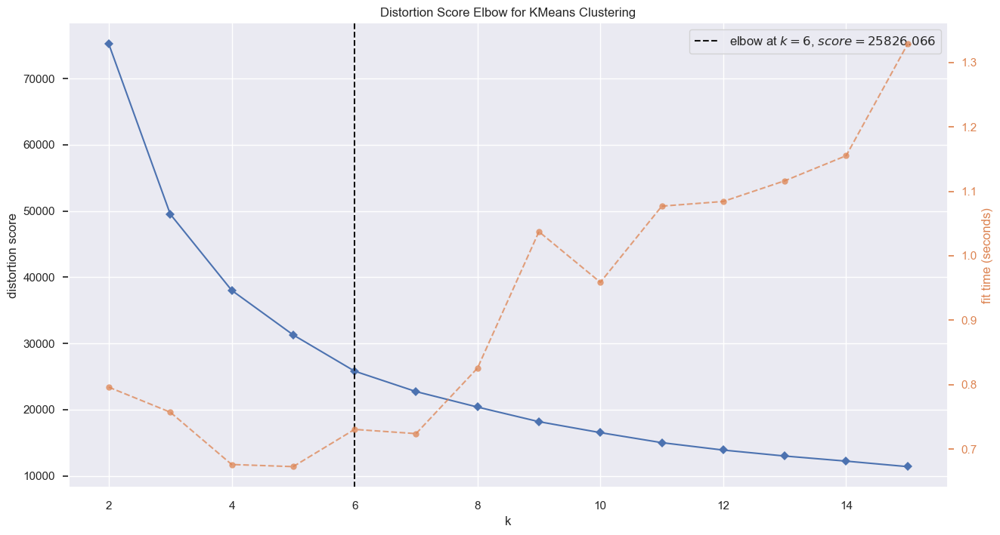

In [45]:
Mean = KMeans()
elbow(pc_df,Mean, k=15)

0.3431523931799335


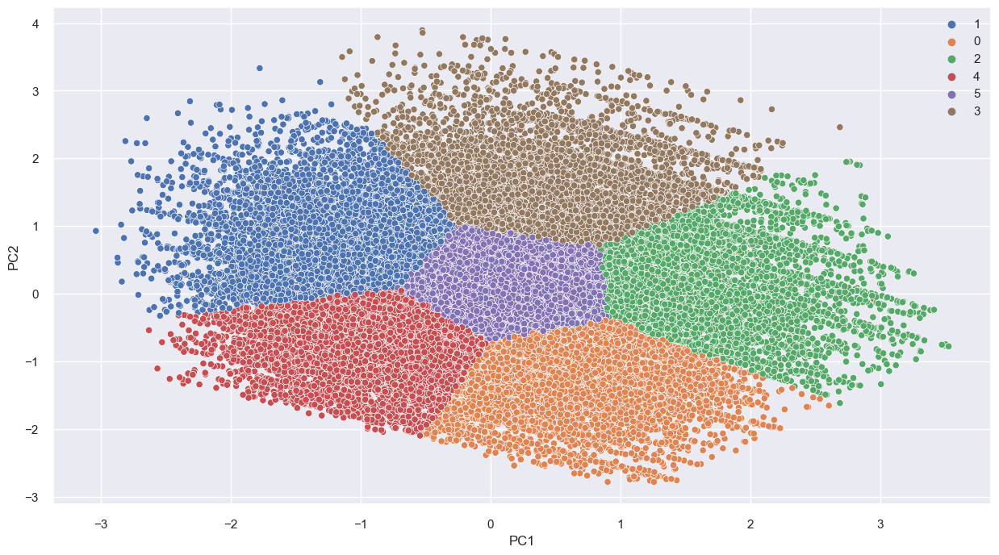

In [46]:
kmeans = KMeans(n_clusters=6).fit(pc_df)
hue = [str(i) for i in kmeans.labels_]
print(silhouette_score(pc_df, kmeans.labels_))
sns.scatterplot(x=pc_df.iloc[:, 0], y=pc_df.iloc[:, 1], hue=hue)
plt.show()

<h3>Experiments</h3>

0.35149961341571845


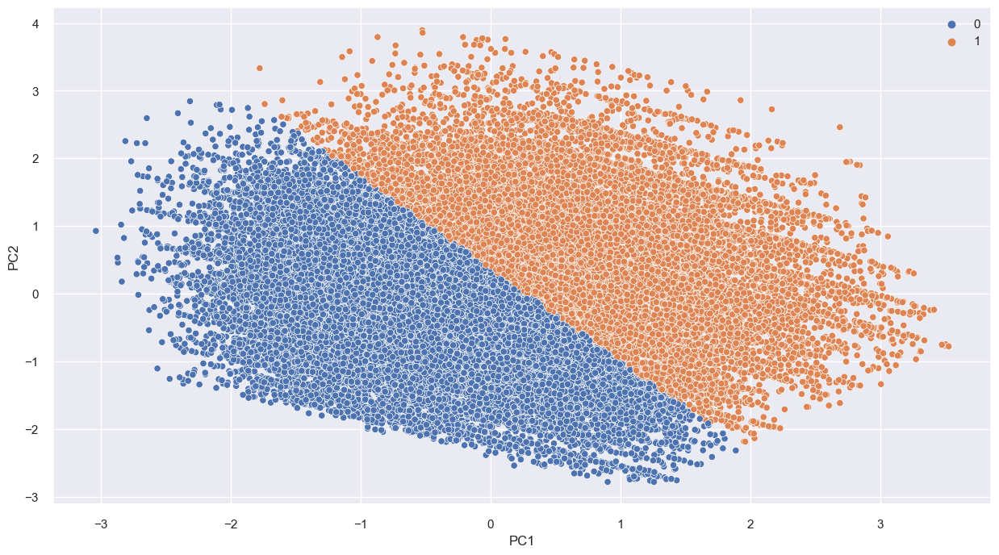

In [47]:
kmeans = KMeans(n_clusters=2).fit(pc_df)
hue = [str(i) for i in kmeans.labels_]
print(silhouette_score(pc_df, kmeans.labels_))
sns.scatterplot(x=pc_df.iloc[:, 0], y=pc_df.iloc[:, 1], hue=hue)
plt.show()

0.3522881678975136


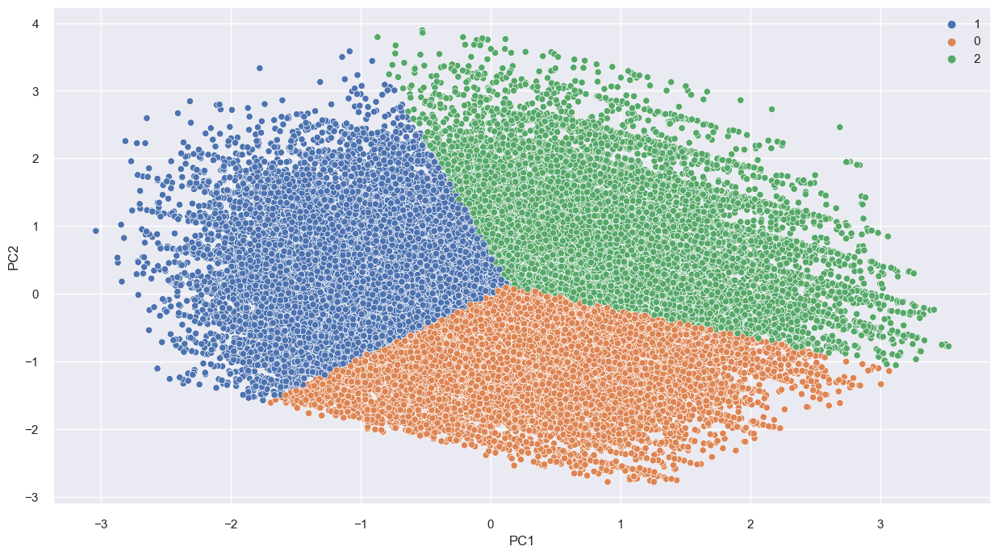

In [48]:
kmeans = KMeans(n_clusters=3).fit(pc_df)
hue = [str(i) for i in kmeans.labels_]
print(silhouette_score(pc_df, kmeans.labels_))
sns.scatterplot(x=pc_df.iloc[:, 0], y=pc_df.iloc[:, 1], hue=hue)
plt.show()

0.3389931079093619


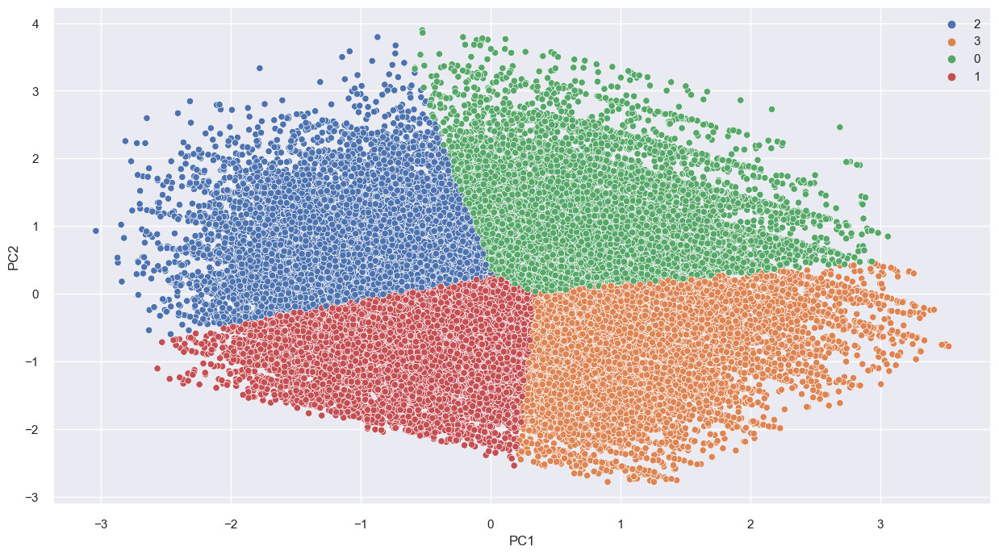

In [49]:
kmeans = KMeans(n_clusters=4).fit(pc_df)
hue = [str(i) for i in kmeans.labels_]
print(silhouette_score(pc_df, kmeans.labels_))
sns.scatterplot(x=pc_df.iloc[:, 0], y=pc_df.iloc[:, 1], hue=hue)
plt.show()

0.3216023462564257


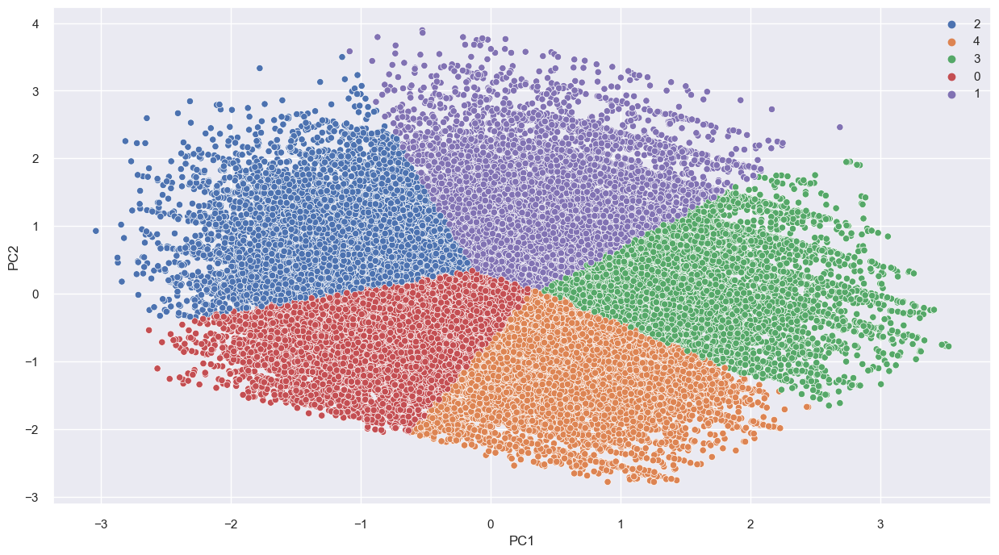

In [50]:
kmeans = KMeans(n_clusters=5).fit(pc_df)
hue = [str(i) for i in kmeans.labels_]
print(silhouette_score(pc_df, kmeans.labels_))
sns.scatterplot(x=pc_df.iloc[:, 0], y=pc_df.iloc[:, 1], hue=hue)
plt.show()

0.34331249963239


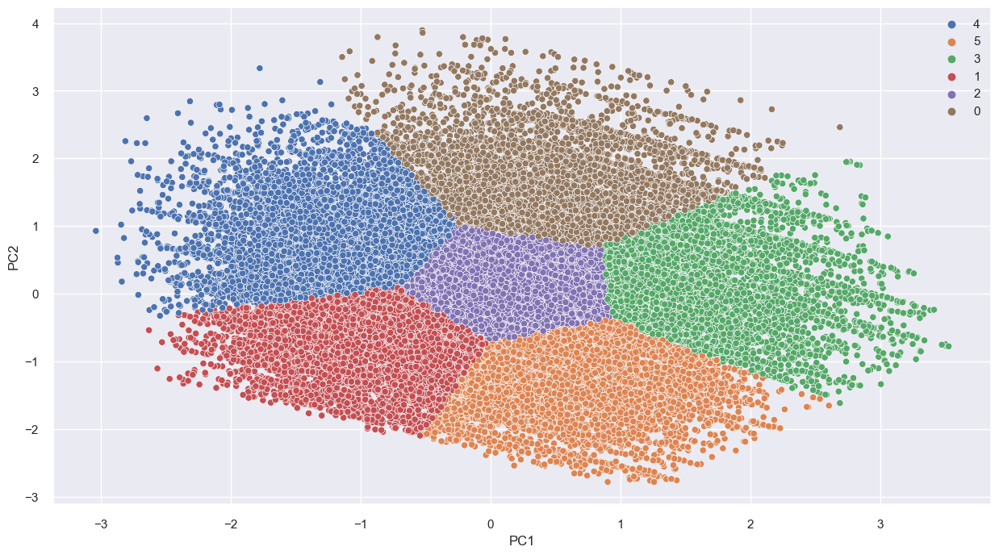

In [51]:
kmeans = KMeans(n_clusters=6).fit(pc_df)
hue = [str(i) for i in kmeans.labels_]
print(silhouette_score(pc_df, kmeans.labels_))
sns.scatterplot(x=pc_df.iloc[:, 0], y=pc_df.iloc[:, 1], hue=hue)
plt.show()

0.31805375004951886


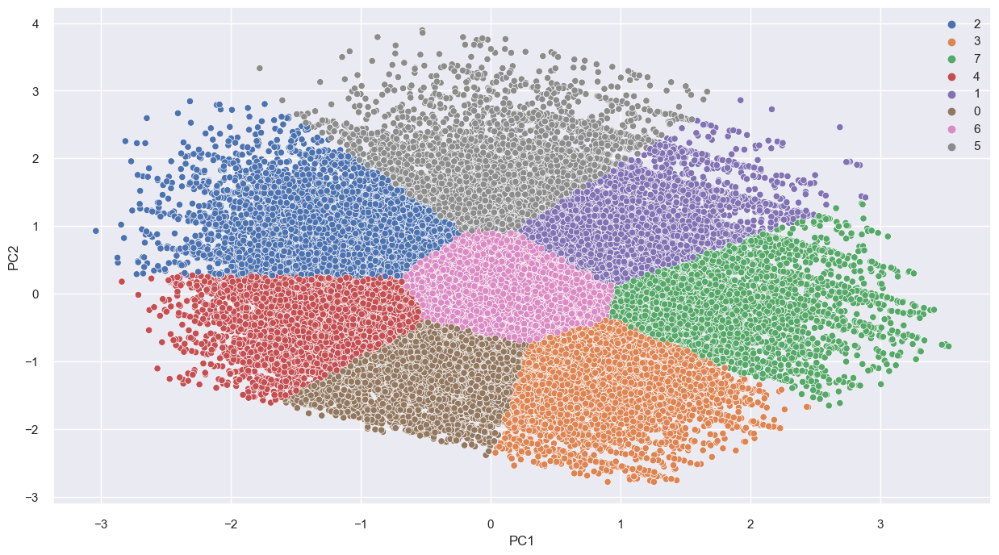

In [52]:
kmeans = KMeans(n_clusters=8).fit(pc_df)
hue = [str(i) for i in kmeans.labels_]
print(silhouette_score(pc_df, kmeans.labels_))
sns.scatterplot(x=pc_df.iloc[:, 0], y=pc_df.iloc[:, 1], hue=hue)
plt.show()

0.32359902108345245


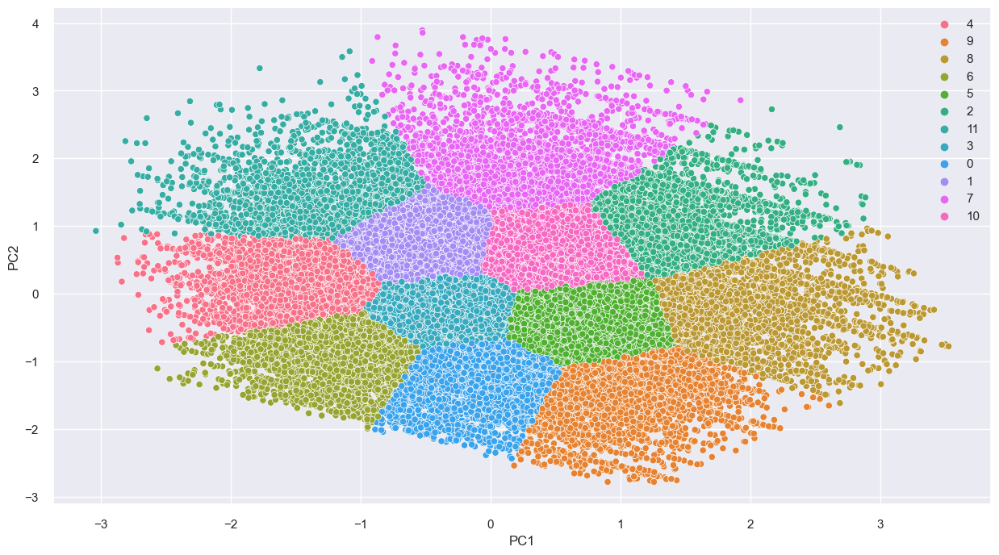

In [53]:
kmeans = KMeans(n_clusters=12).fit(pc_df)
hue = [str(i) for i in kmeans.labels_]
print(silhouette_score(pc_df, kmeans.labels_))
sns.scatterplot(x=pc_df.iloc[:, 0], y=pc_df.iloc[:, 1], hue=hue)
plt.show()

<h2>GMM </h2>

In [54]:
from sklearn.mixture import GaussianMixture
from scipy.spatial.distance import cdist

In [57]:
n_components_range = range(2, 15)
shilhoutte = []
for n_components in n_components_range:
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    gmm.fit(pc_d[.f)
    labels = gmm.predict(pc_df)
    shilhoutte.append(silhouette_score(pc_df, labels))

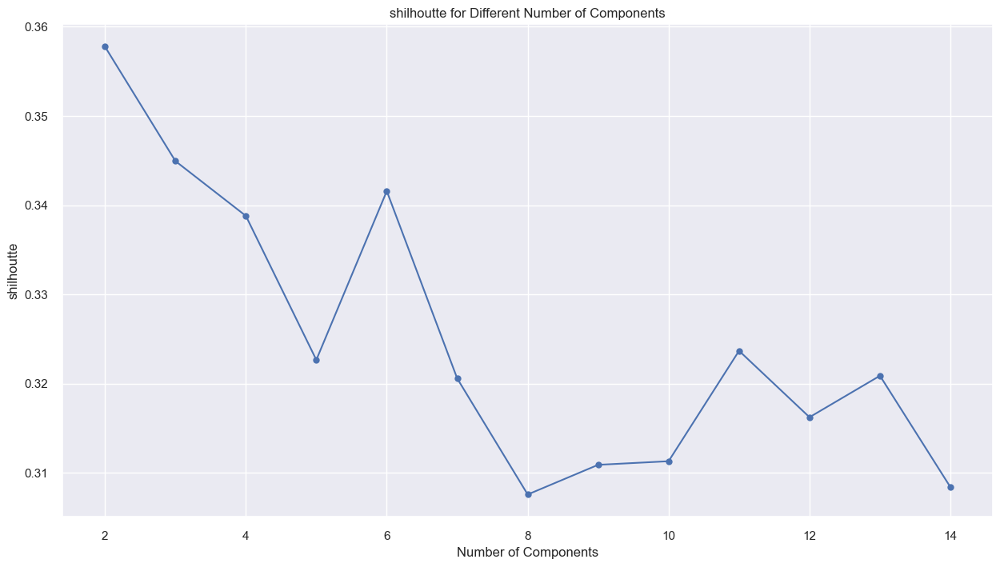

In [58]:
plt.plot(n_components_range, shilhoutte, marker='o')
plt.title('shilhoutte for Different Number of Components')
plt.xlabel('Number of Components')
plt.ylabel('shilhoutte')
plt.show()

Optimal number of components: 8
0.3075784731078536


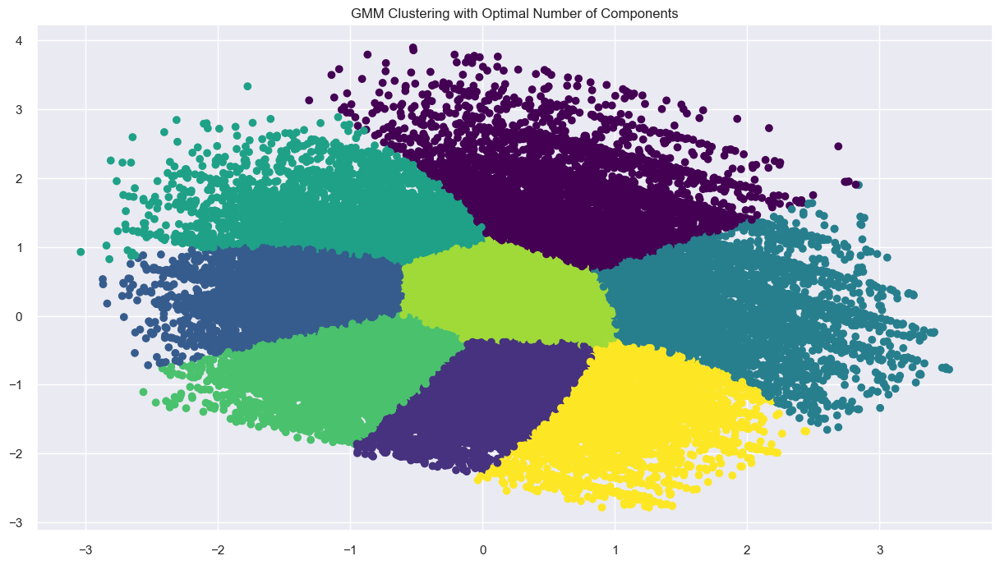

In [57]:
optimal_components = np.argmin(bic_scores) + 1  # Add 1 because the range starts from 1
print(f"Optimal number of components: {optimal_components}")

# Fit the GMM with the optimal number of components
optimal_gmm = GaussianMixture(n_components=optimal_components, random_state=42)
optimal_gmm.fit(pc_df)
labels = optimal_gmm.predict(pc_df)
silhouette_avg = silhouette_score(pc_df, labels)
print(silhouette_avg)
# Visualize the clustering result
plt.scatter(pc_df.iloc[:, 0], pc_df.iloc[:, 1], c=labels, cmap='viridis')
plt.title('GMM Clustering with Optimal Number of Components')
plt.show()

<h3>Eperiment</h3>

0.3577631393450457


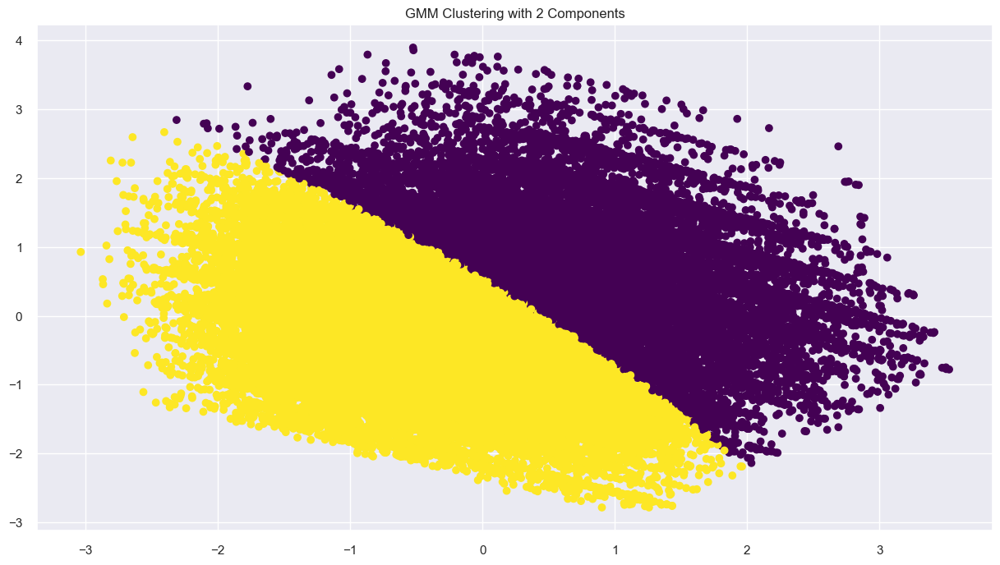

In [58]:
optimal_gmm = GaussianMixture(n_components=2, random_state=42)
optimal_gmm.fit(pc_df)
labels = optimal_gmm.predict(pc_df)
silhouette_avg = silhouette_score(pc_df, labels)
print(silhouette_avg)
# Visualize the clustering result
plt.scatter(pc_df.iloc[:, 0], pc_df.iloc[:, 1], c=labels, cmap='viridis')
plt.title('GMM Clustering with 2 Components')
plt.show()

0.34493826052626647


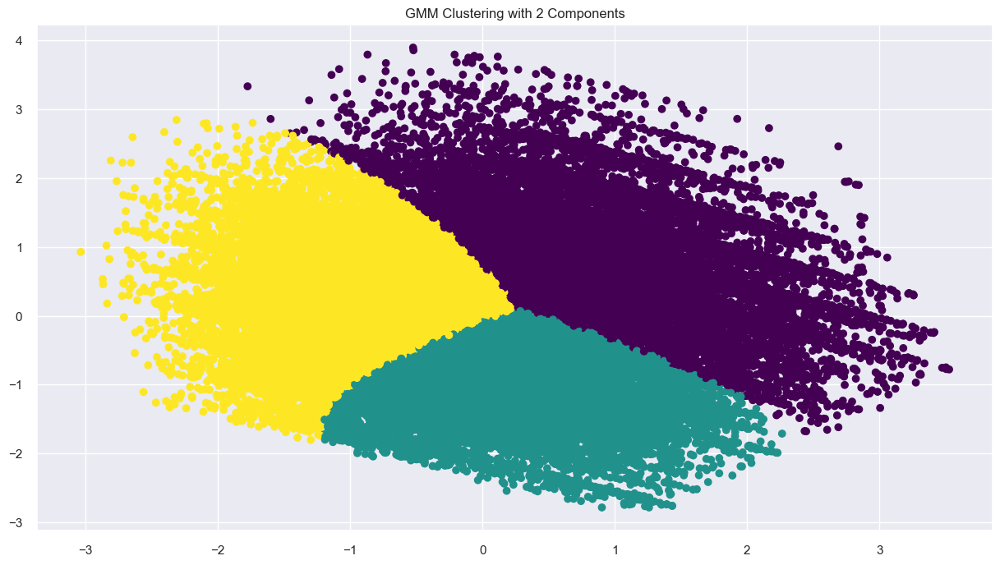

In [59]:
optimal_gmm = GaussianMixture(n_components=3, random_state=42)
optimal_gmm.fit(pc_df)
labels = optimal_gmm.predict(pc_df)
silhouette_avg = silhouette_score(pc_df, labels)
print(silhouette_avg)
# Visualize the clustering result
plt.scatter(pc_df.iloc[:, 0], pc_df.iloc[:, 1], c=labels, cmap='viridis')
plt.title('GMM Clustering with 2 Components')
plt.show()

0.3387982523583117


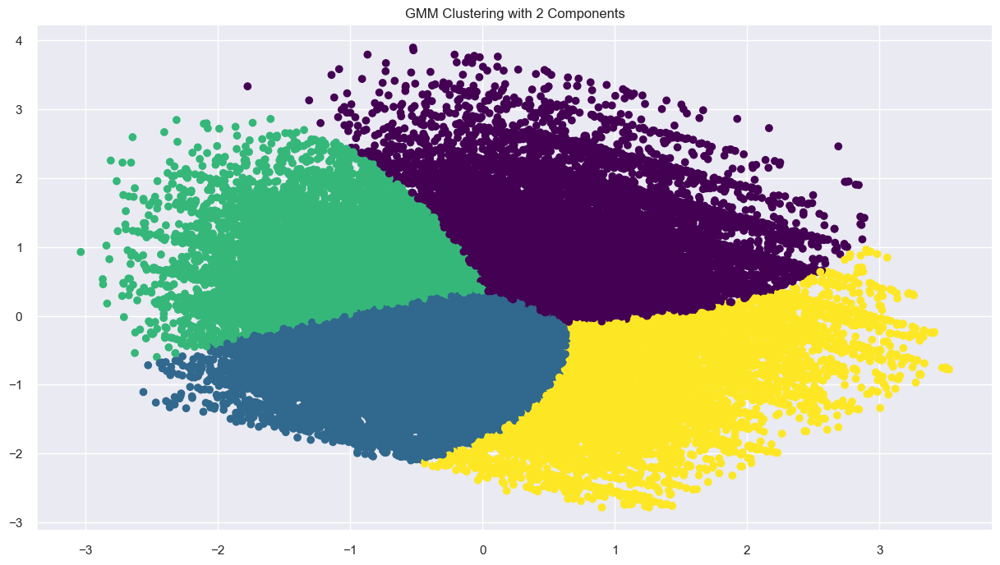

In [59]:
optimal_gmm = GaussianMixture(n_components=4, random_state=42)
optimal_gmm.fit(pc_df)
labels = optimal_gmm.predict(pc_df)
silhouette_avg = silhouette_score(pc_df, labels)
print(silhouette_avg)
# Visualize the clustering result
plt.scatter(pc_df.iloc[:, 0], pc_df.iloc[:, 1], c=labels, cmap='viridis')
plt.title('GMM Clustering with 4 Components')
plt.show()

0.3226589567442248


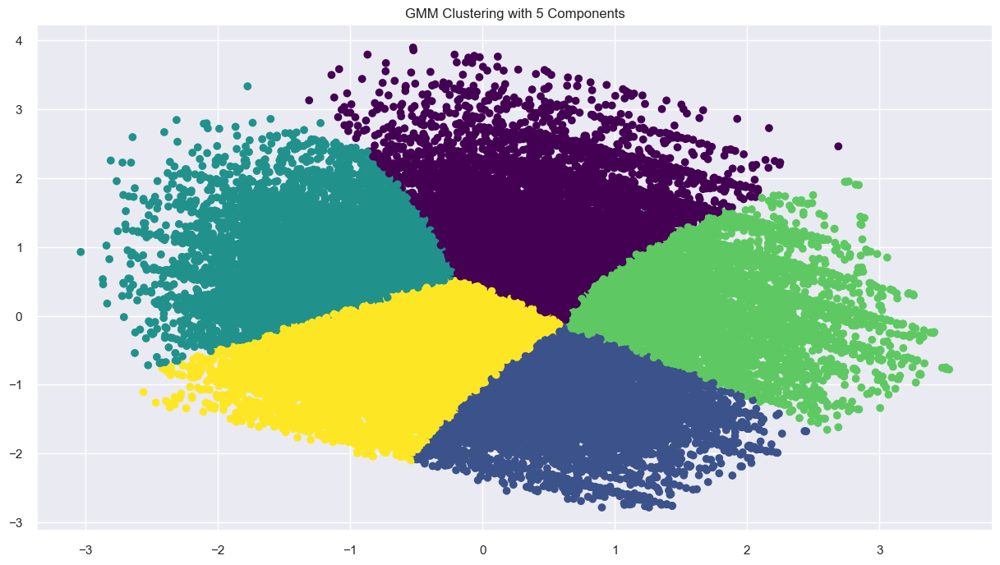

In [60]:
optimal_gmm = GaussianMixture(n_components=5, random_state=42)
optimal_gmm.fit(pc_df)
labels = optimal_gmm.predict(pc_df)
silhouette_avg = silhouette_score(pc_df, labels)
print(silhouette_avg)
# Visualize the clustering result
plt.scatter(pc_df.iloc[:, 0], pc_df.iloc[:, 1], c=labels, cmap='viridis')
plt.title('GMM Clustering with 5 Components')
plt.show()

0.3415765310814678


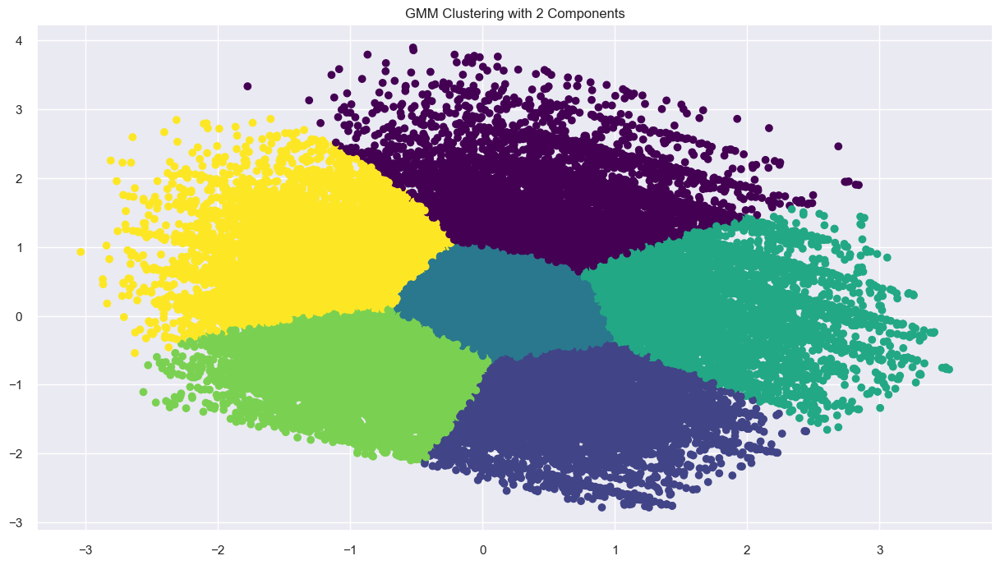

In [60]:
optimal_gmm = GaussianMixture(n_components=6, random_state=42)
optimal_gmm.fit(pc_df)
labels = optimal_gmm.predict(pc_df)
silhouette_avg = silhouette_score(pc_df, labels)
print(silhouette_avg)
# Visualize the clustering result
plt.scatter(pc_df.iloc[:, 0], pc_df.iloc[:, 1], c=labels, cmap='viridis')
plt.title('GMM Clustering with 2 Components')
plt.show()

0.3075784731078536


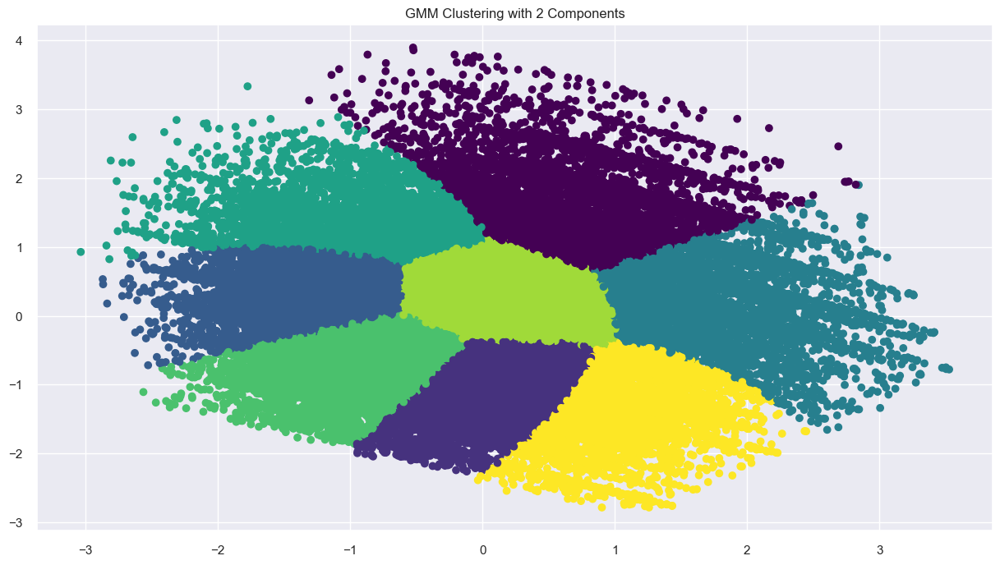

In [61]:
optimal_gmm = GaussianMixture(n_components=8, random_state=42)
optimal_gmm.fit(pc_df)
labels = optimal_gmm.predict(pc_df)
silhouette_avg = silhouette_score(pc_df, labels)
print(silhouette_avg)
# Visualize the clustering result
plt.scatter(pc_df.iloc[:, 0], pc_df.iloc[:, 1], c=labels, cmap='viridis')
plt.title('GMM Clustering with 8 Components')
plt.show()

0.3162369478313663


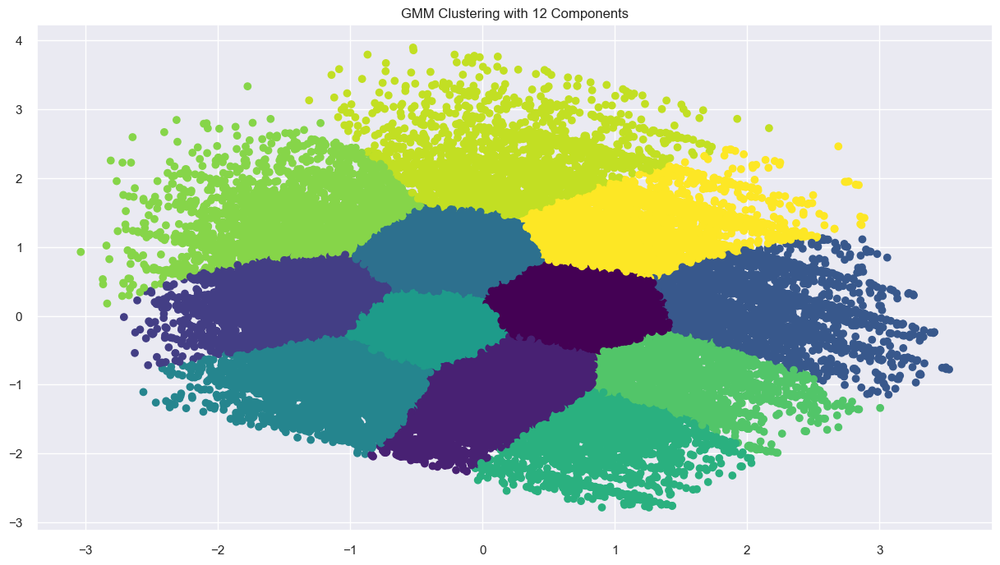

In [61]:
optimal_gmm = GaussianMixture(n_components=12, random_state=42)
optimal_gmm.fit(pc_df)
labels = optimal_gmm.predict(pc_df)
silhouette_avg = silhouette_score(pc_df, labels)
print(silhouette_avg)
# Visualize the clustering result
plt.scatter(pc_df.iloc[:, 0], pc_df.iloc[:, 1], c=labels, cmap='viridis')
plt.title('GMM Clustering with 12 Components')
plt.show()